# Purpose
The purpose of this notebook is to explore methods of using a machine learning model (like random forest) to "optimize" your inputs. i.e. if you want to achieve a specific result, by "prescribing" particular actions or making particular changes in your feature space, what actions would you suggest?

i.e. if you can model a manufacturing process, can you use that model to adjust your factory or machine settings to increase ("optimize") your output?

We'll first build a model using the california housing dataset from sklearn, and then explore various optimization methods to see if they make sense. 

I have no idea if any of this is "scientifically valid". Causality is a deep field, and even if you have a very accuracte model, I don't know if you can use that model to prescribe actions that will optimize your output and reasonably expect those actions to actually result in optimal results in real life. More stuff to research. 

In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import hvplot.pandas  # noqa

from sklearn.datasets import fetch_california_housing

pd.set_option('display.precision', 2)
pd.set_option('display.float_format', '{:.2f}'.format)

In [56]:
ca = fetch_california_housing(as_frame=True)

In [57]:
print(ca.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

:Number of Instances: 20640

:Number of Attributes: 8 numeric, predictive attributes and the target

:Attribute Information:
    - MedInc        median income in block group
    - HouseAge      median house age in block group
    - AveRooms      average number of rooms per household
    - AveBedrms     average number of bedrooms per household
    - Population    block group population
    - AveOccup      average number of household members
    - Latitude      block group latitude
    - Longitude     block group longitude

:Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per ce

In [58]:
df = ca.frame

In [59]:
df.describe(percentiles=[0.25,0.5, 0.75, 0.99, 0.999])

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.00,20640.00,20640.00,20640.00,20640.00,20640.00,20640.00,20640.00,20640.00
mean,3.87,28.64,5.43,1.10,1425.48,3.07,35.63,-119.57,2.07
std,1.90,12.59,2.47,0.47,1132.46,10.39,2.14,2.00,1.15
min,0.50,1.00,0.85,0.33,3.00,0.69,32.54,-124.35,0.15
25%,2.56,18.00,4.44,1.01,787.00,2.43,33.93,-121.80,1.20
50%,3.53,29.00,5.23,1.05,1166.00,2.82,34.26,-118.49,1.80
75%,4.74,37.00,6.05,1.10,1725.00,3.28,37.71,-118.01,2.65
99%,10.60,52.00,10.36,2.13,5805.83,5.39,40.63,-116.29,5.00
99.9%,15.00,52.00,34.20,6.62,10372.68,13.63,41.75,-114.65,5.00
max,15.00,52.00,141.91,34.07,35682.00,1243.33,41.95,-114.31,5.00


In [60]:
# df.describe().to_csv('./describe.csv', index=True)

# EDA

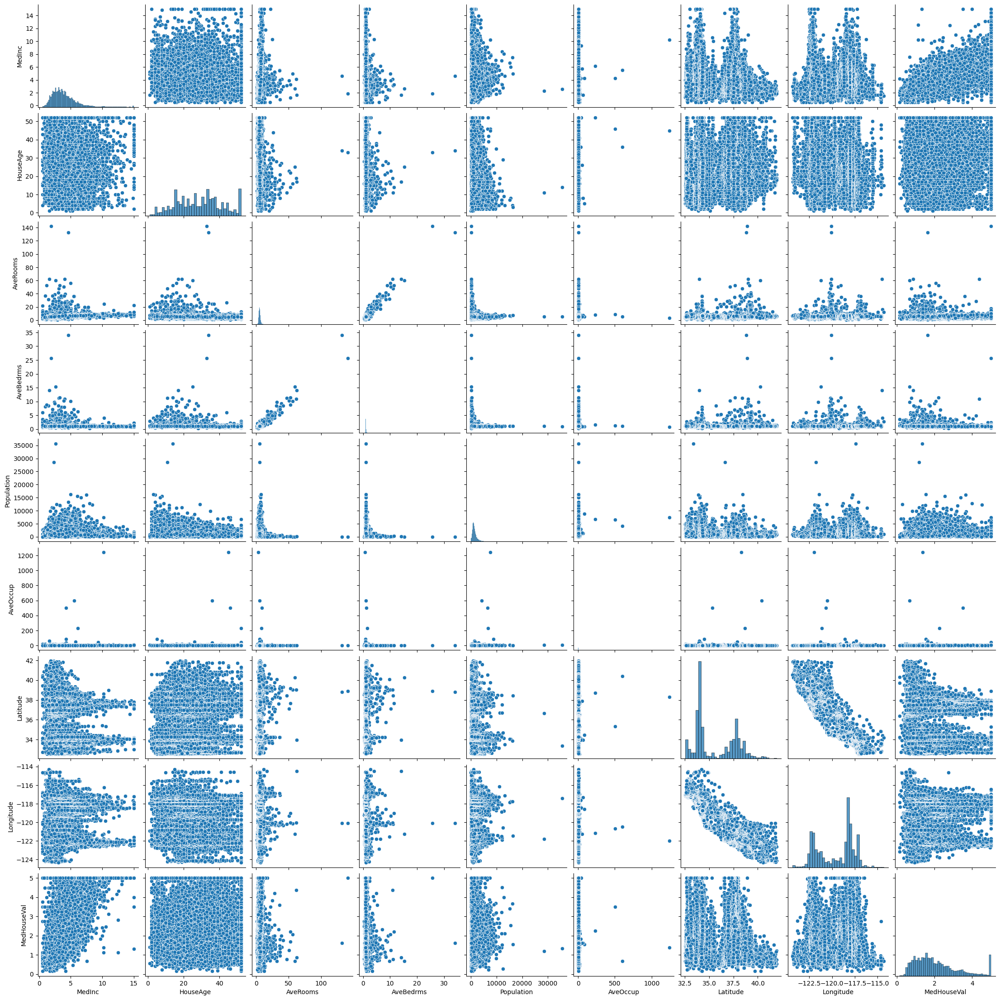

In [40]:
sns.pairplot(df)

There are outliers in the input feature set that are keeping me from being able to clearly see some of the distributions of the input features. 

We know this because of the output of the .describe() table above - the max value for some of the columns is clearly much larger than the 99th percentile.

I want a sense for how many outliers there are in the dataset.

Let's define outliers as data beyond the 99th percentile.

In [5]:
features = ca.feature_names

In [61]:
_series = []
quantiles = [0, 0.25, 0.5, 0.75, 0.99, 0.999, 1]
for i, col in enumerate(features):
    print(i, col)
    series = pd.qcut(df[col], q=quantiles, duplicates='drop').value_counts().sort_index()
    _series.append(series)

# Reset the index of each Series and store them with a new column name
reset_series = {features[i]: s.reset_index(drop=True) for i, s in enumerate(_series)}

# Convert the dictionary of Series to a DataFrame
result_df = pd.DataFrame.from_dict(reset_series) 
result_df.index = quantiles[:-1]
result_df

0 MedInc
1 HouseAge
2 AveRooms
3 AveBedrms
4 Population
5 AveOccup
6 Latitude
7 Longitude


,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0.00,5160.00,5326.00,5160,5160,5164,5160,5192,5165
0.25,5160.00,5343.00,5160,5170,5161,5160,5197,5198
0.50,5160.00,5026.00,5161,5151,5159,5160,5094,5132
0.75,4953.00,4945.00,4952,4952,4949,4953,4950,4941
0.99,207.00,NaN,186,186,186,186,186,183
1.00,NaN,NaN,21,21,21,21,21,21


Looks like theres a group of ~21 samples that are > 99.9th quantile. Let's just drop those

In [62]:
df = df[df['AveOccup'] < df['AveOccup'].quantile(0.99)]
df = df[df['AveRooms'] < df['AveRooms'].quantile(0.99)]
df = df[df['AveBedrms'] < df['AveBedrms'].quantile(0.99)]
df = df[df['Population'] < df['Population'].quantile(0.99)]

In [63]:
df.shape

(19824, 9)

In [64]:
df.describe(percentiles=[0.25,0.5, 0.75, 0.99, 0.999])

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,19824.00,19824.00,19824.00,19824.00,19824.00,19824.00,19824.00,19824.00,19824.00
mean,3.88,28.97,5.26,1.06,1369.49,2.90,35.62,-119.59,2.08
std,1.89,12.49,1.20,0.09,861.00,0.69,2.12,2.00,1.16
min,0.50,1.00,0.85,0.33,3.00,0.75,32.54,-124.35,0.15
25%,2.57,19.00,4.43,1.00,798.00,2.43,33.93,-121.81,1.20
50%,3.54,29.00,5.20,1.05,1168.00,2.82,34.25,-118.50,1.81
75%,4.76,37.00,5.99,1.10,1705.00,3.27,37.71,-118.02,2.67
99%,10.58,52.00,8.40,1.43,4549.85,4.87,40.61,-116.45,5.00
99.9%,15.00,52.00,9.67,1.57,5565.60,5.29,41.75,-114.65,5.00
max,15.00,52.00,10.35,1.59,5731.00,5.39,41.95,-114.55,5.00


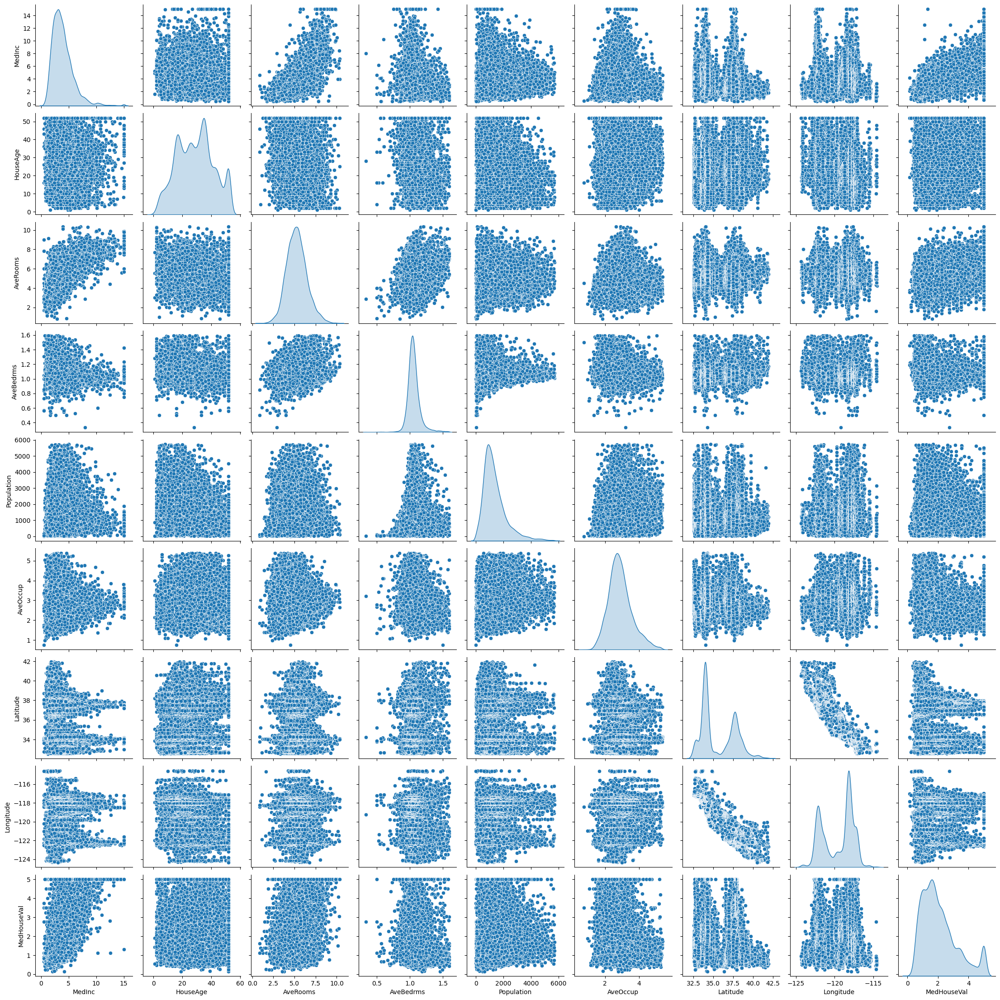

In [192]:
sns.pairplot(df, diag_kind='kde')

It appears as if there is a large number of districts with `MedHouseVal` ~= 5. I think probably what happened is some data entry error that caps the value for the response variable at around 5. My suggestions is to drop these rows.

In [65]:
print(df[df['MedHouseVal'] <= 5].shape)
df = df[df['MedHouseVal'] <= 5] 

(18885, 9)


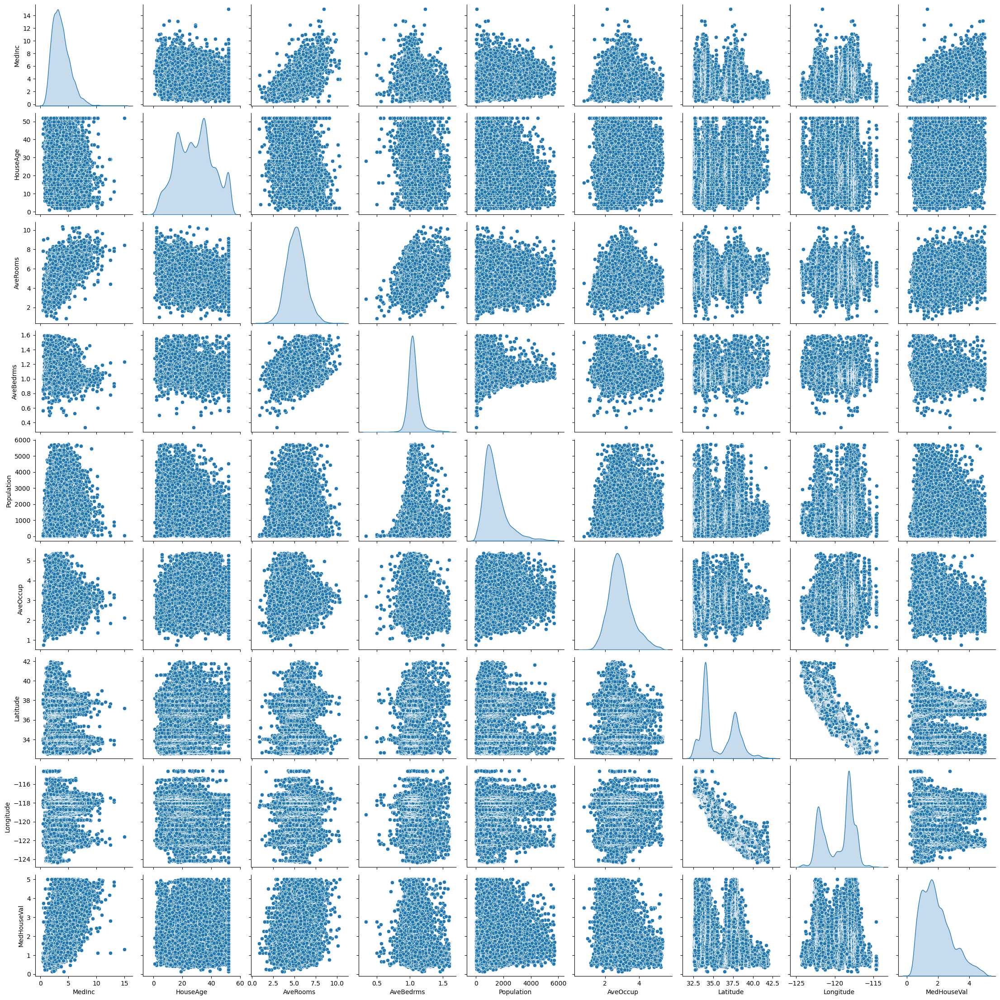

In [11]:
sns.pairplot(df, diag_kind='kde')

In [73]:
df.isna().sum()

MedInc         0
HouseAge       0
AveRooms       0
AveBedrms      0
Population     0
AveOccup       0
Latitude       0
Longitude      0
MedHouseVal    0
dtype: int64

# Baseline Model

Let's fit a baseline RF model because I really just want to get straight to optimization of the input parameters. 

## Prep

In [67]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

In [66]:
target = 'MedHouseVal'

In [68]:
X = df.drop(columns=[target])  # Features
y = df[target]                 # Target variable

# Splitting the data (use 80-20 split for training and testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

## Random Forest Regressor

In [69]:
# Import necessary libraries
from sklearn.ensemble import RandomForestRegressor

# Initialize the Random Forest Regressor with some common hyperparameters
rf_model = RandomForestRegressor(
    n_estimators=100,          # Number of trees
    max_depth=None,            # Expand trees until all leaves are pure
    min_samples_split=2,       # Minimum samples to split an internal node
    min_samples_leaf=1,        # Minimum samples in a leaf node
    random_state=42,           # Random seed for reproducibility
    n_jobs=-1                  # Use all available cores for faster computation
)

# Fit the model to the training data
rf_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

RMSE: 0.46
R-squared: 0.79


In [70]:
y_test.mean()

1.9364090548054012

In [71]:
rmse / y_test.mean()

0.23696792371237493

RMSE of 0.46 isn't bad, I feel, since the average prediction is off by 0.46 units, and the average observed value is 1.93, so the ratio is 0.23, which means the average error is 23% off from the average observed value. 

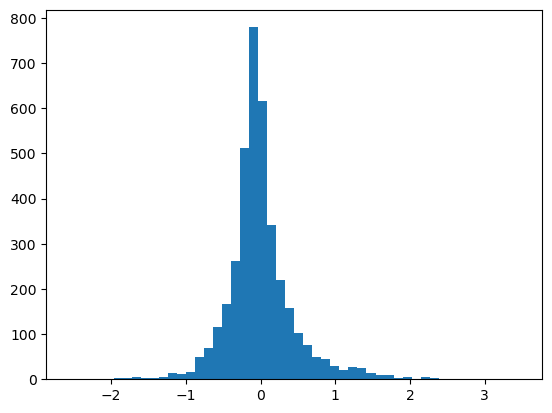

In [72]:
errors = y_test - y_pred
plt.hist(errors, bins=50);

Errors are normally distributed, which is a good sign. 

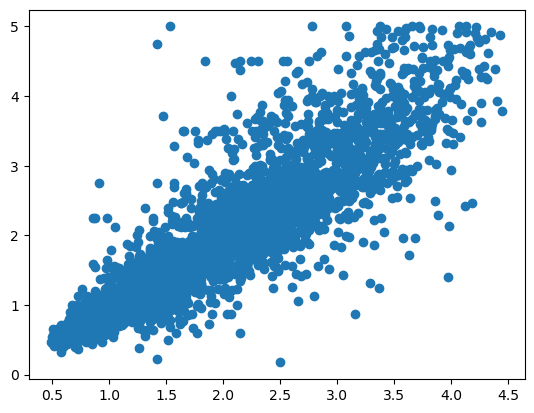

In [73]:
plt.scatter(y_pred, y_test)

Linear relation between observed value and predicted values along the range of predicted values, which is good too. 

## XGBoost Regressor

In [74]:
import xgboost

# Initialize the Random Forest Regressor with some common hyperparameters
xgbr_model = xgboost.XGBRegressor()

# Fit the model to the training data
xgbr_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = xgbr_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"RMSE: {rmse:.2f}")
print(f"R-squared: {r2:.2f}")

RMSE: 0.43
R-squared: 0.81


A little better.

In [90]:
# model = xgbr_model # save our best model
model = rf_model

# Optimization of the inputs

This dataset isn't a great example because all of the features in the dataset are not "levers" that can be easily manipulated. But I'm more concerned with how the math works than actually optimizing this dataset and suggesting actions to take - I'm just testing my methodology. 

So the question is, for any given data point in this data set, how can we adjust it's feature values to increase the target value (`MedHouseVal`)?

So if we can take any data point and adjust it's latitude, longitude, population, etc to instantly be any value we want (within reason) how should we make those adjustments to maximize the resulting `MedHouseVal`?

This is the approach I'll start with:
- Identify key features that influence the output.
- Determine the direction and magnitude of impact for these features.
- Simulate counterfactual scenarios and optimize where feasible.
- Summarize findings into actionable steps, specifying feature adjustments to minimize the output.

In [91]:
# Feature importance
feature_importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
print("Feature Importances:\n", feature_importances)

Feature Importances:
 MedInc       0.46
AveOccup     0.14
Longitude    0.12
Latitude     0.11
AveRooms     0.05
HouseAge     0.05
Population   0.03
AveBedrms    0.03
dtype: float64


- `MedInc` is the most important feature
- `AveOccup` is the second most important feature
- The next 2 are related to geography, however I think the actual relationships between location and median house value are too complex to be modeled using latitude and longitude directly. Since we didn't do any feature engineering to make these features more usable, I'm not going to concern myself with them.

Therefore I'll start experimenting with `MedInc` and `AveOccup`. 

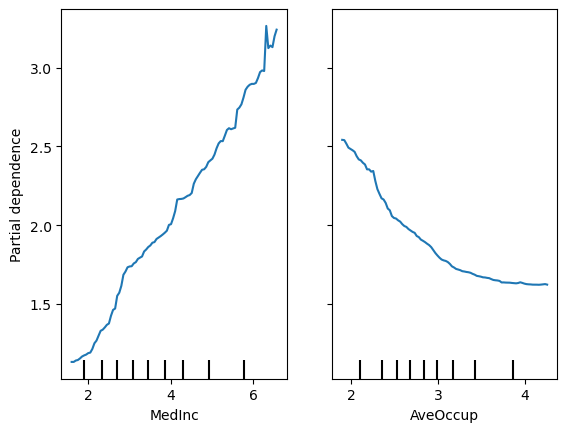

In [93]:
from sklearn.inspection import PartialDependenceDisplay
PartialDependenceDisplay.from_estimator(model, X, features=['MedInc','AveOccup'])

- `MedInc` has a positive effect on `MedHouseVal` that looks pretty linear.
- `AveOccup` has a negative effect on `MedHouseVal` but it is not linear (looks quadratic)

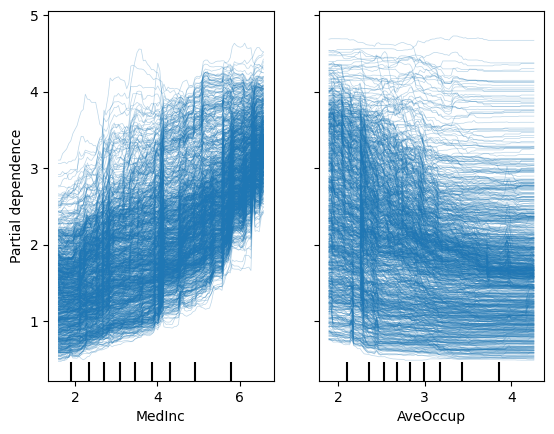

In [94]:
PartialDependenceDisplay.from_estimator(model, X, features=['MedInc','AveOccup'], kind='individual')

- `MedInc` looks like generally all data points follow the upward trend.
- `AveOccup` there are definitely some data points that do not follow the downward trend (see the stright lines in the upper right portion of the graph, and possible some straight lines in the lower portion of the graph). This means that our model does not always expect there to be a decrease in `MedHouseVal` when `AveOccup` increases. Maybe we should look into how to discover which sub-populations do not follow the trend?

Anyways, let's do some optimization using our model and see how the inputs and outputs changed, to see if our optimization process is working well.

- Define the Cost Function: Set up the function you want to minimize.
- Run Optimization with Initial Values: Use minimize to optimize the function.
- Compare Initial and Optimized Values: After optimization, calculate the differences between initial values and optimized values to understand how each input was adjusted.

In [103]:
from scipy.optimize import minimize
import numpy as np

sample = df.sample(n=1, random_state=42)
x = sample[features].values.reshape(-1)
y = sample[target]
maximum_output = df[target].max()

# Define the cost function with a small regularization term
def cost_function(x):
    # Prediction cost: minimize distance between the maximum output and the prediction
    prediction_cost = maximum_output - model.predict([x])[0]
    # Regularization term: encourage adjustment from initial values
    regularization = 0.01 * np.sum((x - initial_values) ** 2)
    return prediction_cost + regularization

# Initial guess for the input values
initial_values = x

# Set realistic bounds for each input (based on feature ranges in your dataset)
# For example, if features range from 0 to 1, use [(0, 1), (0, 1), ...]
feature_bounds = [(df[feature].min(), df[feature].max()) for feature in features]

# Perform optimization
result = minimize(cost_function, initial_values, method='Powell', bounds=feature_bounds, options={'disp':False})

# Extract the optimized values
optimized_values = result.x

# Calculate the changes in inputs
input_changes = optimized_values - initial_values

# Display the results
print("Initial values:", initial_values)
print("Optimized values:", optimized_values)
print("Changes in inputs:", input_changes)
print("Minimum cost:", result.fun)

C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\n

Initial values: [   7.266        52.            7.43661972    1.03098592  973.
    2.74084507   37.89       -122.27      ]
Optimized values: [   7.85656888   51.99994878    7.14099568    1.09099662  972.99999988
    2.19206003   37.29498344 -122.06497345]
Changes in inputs: [ 5.90568880e-01 -5.12163903e-05 -2.95624038e-01  6.00107060e-02
 -1.19171546e-07 -5.48785042e-01 -5.95016558e-01  2.05026554e-01]
Minimum cost: 0.5003101207591706


C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
C:\Users\n

In [104]:
# Display the results with 2 decimal places
print(result)
print(f"Minimum cost: {result.fun:.2f}")
print(f"Initial Predicted MedHouseVal: {model.predict([x_sample])[0]:.2f}")
print(f"Maximum Predicted MedHouseVal Achieved: {maximum_output - result.fun:.2f}")

 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: 0.5003101207591706
       x: [ 7.857e+00  5.200e+01  7.141e+00  1.091e+00  9.730e+02
            2.192e+00  3.729e+01 -1.221e+02]
     nit: 5
   direc: [[ 1.000e+00  0.000e+00 ...  0.000e+00  0.000e+00]
           [ 0.000e+00  1.000e+00 ...  0.000e+00  0.000e+00]
           ...
           [ 0.000e+00  0.000e+00 ...  1.000e+00  0.000e+00]
           [ 0.000e+00  0.000e+00 ...  0.000e+00  1.000e+00]]
    nfev: 904
Minimum cost: 0.50
Initial Predicted MedHouseVal: 3.86
Maximum Predicted MedHouseVal Achieved: 4.50


C:\Users\nzorn\anaconda3\envs\stats\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [88]:
pd.DataFrame(
    index=features, 
    columns=['Initial Values','Optimized Values','Change', 'Change (%)'], 
    data=np.stack([initial_values, optimized_values, input_changes, (input_changes / initial_values * 100)], axis=1),
)

,Initial Values,Optimized Values,Change,Change (%)
MedInc,7.27,6.04,-1.23,-16.89
HouseAge,52.00,15.80,-36.20,-69.62
AveRooms,7.44,10.25,2.81,37.80
AveBedrms,1.03,1.37,0.34,32.77
Population,973.00,2002.36,1029.36,105.79
AveOccup,2.74,2.53,-0.21,-7.63
Latitude,37.89,39.73,1.84,4.85
Longitude,-122.27,-115.91,6.36,-5.20


In [89]:
4.5 - 3.86

0.6400000000000001

So our optimization process for this particular sample resulted in:
- The largest change occurring in `AveOccup` with a -20% shift
- The second largest change occurring in `MedInc` with a 8.1% shift
- Third largest change occuring in `AveBedrms` with a 5.8% shift

As we expected (due to our ICE plots), the largest shifts occur with `MedInc` and `AveOccup`. So this tracks. 

We went from a `MedHouseVal` of 3.86  to 4.5 - a $64k (or 16%) increase - not bad!

So I think we may face a "correlation not causation" issue here, which is what I was worried about. 
Say we actually force landlords in this district to evict their tenants such that we get an decrease in the average occupation per household of 20%.
What impact would that have on the median house value for this district?
Probably nothing. At least initially. Assuming the evicted tenants move to another district and don't become homeless within the district, maybe there would be less congestion on the roads, maybe the whole housing market would collapse because there are too few tenants paying rent? 

The whole problem statement is ridiculous because "optimizing" this dataset doesn't make any sense. But the data was just used as an example. 

In [51]:
from scipy.optimize import minimize
import numpy as np
import pandas as pd

# Define the maximum output target as the maximum target value in the dataset
maximum_output = df[target].max()

# Create empty lists and dictionary to store results
results_list = []
detailed_results = {}

# Sample 50 data points from df
sample_df = df.sample(n=10, random_state=42)

# Loop through each sample point and perform optimization
for idx, row in sample_df.iterrows():
    print(idx)
    x = row[features].values  # Initial values
    y = row[target]           # Actual target value
    
    # Initial guess for the input values
    initial_values = x
    
    # Define bounds based on the feature ranges in the dataset
    feature_bounds = [(df[feature].min(), df[feature].max()) for feature in features]

    # Define the cost function
    def cost_function(x):
        # Prediction cost: minimize distance between maximum output and prediction
        prediction_cost = maximum_output - rf_model.predict([x])[0]
        # Regularization term: encourage adjustment from initial values
        regularization = 0.01 * np.sum((x - initial_values) ** 2)
        return prediction_cost + regularization

    # Perform optimization using Powell's method
    result = minimize(cost_function, initial_values, method='Powell', bounds=feature_bounds, options={'disp': False})

    # Extract the optimized values and calculate changes
    optimized_values = result.x
    input_changes = optimized_values - initial_values
    initial_pred = rf_model.predict([initial_values])[0]
    final_pred = rf_model.predict([optimized_values])[0]
    
    # Append summary results for results_df
    results_list.append({
        "idx": idx,
        "success": result.success,
        "nit": result.nit,
        "nfev": result.nfev,
        "minimum cost": result.fun,
        "initial predicted value": initial_pred,
        "final predicted value": final_pred,
        "change": final_pred - initial_pred,
        "change (%)": (final_pred - initial_pred) / initial_pred * 100
    })
    
    # Create a DataFrame for detailed results and store it in the dictionary
    detailed_results[idx] = pd.DataFrame(
        index=features, 
        columns=['Initial Values', 'Optimized Values', 'Change', 'Change (%)'], 
        data=np.stack([initial_values, optimized_values, input_changes, (input_changes / initial_values * 100)], axis=1)
    )

# Convert the results list into a DataFrame
results_df = pd.DataFrame(results_list)

# Display results
print("Summary Results:")
print(results_df)

415
7956
42
10837
4560
9645
7248
3528
20384
9659
Summary Results:
     idx  success  nit  nfev  minimum cost  initial predicted value  \
0    415     True    5   905          0.50                     3.86   
1   7956     True    4   724          1.06                     1.80   
2     42     True    3   463          1.13                     1.28   
3  10837     True    3   510          0.49                     3.68   
4   4560     True    2   320          1.28                     2.15   
5   9645     True    5   853          0.86                     1.32   
6   7248     True    2   344          1.24                     1.58   
7   3528     True    9  1554          0.51                     2.35   
8  20384     True    3   537          0.72                     2.47   
9   9659     True    4   694          1.05                     0.63   

   final predicted value  change  change (%)  
0                   4.51    0.65       16.84  
1                   4.35    2.55      142.02  
2          

In [52]:
results_df

,idx,success,nit,nfev,minimum cost,initial predicted value,final predicted value,change,change (%)
0,415,True,5,905,0.50,3.86,4.51,0.65,16.84
1,7956,True,4,724,1.06,1.80,4.35,2.55,142.02
2,42,True,3,463,1.13,1.28,4.36,3.08,241.53
3,10837,True,3,510,0.49,3.68,4.66,0.97,26.42
4,4560,True,2,320,1.28,2.15,4.18,2.03,94.32
5,9645,True,5,853,0.86,1.32,4.48,3.15,238.17
6,7248,True,2,344,1.24,1.58,4.26,2.68,170.03
7,3528,True,9,1554,0.51,2.35,4.58,2.23,94.89
8,20384,True,3,537,0.72,2.47,4.39,1.91,77.37
9,9659,True,4,694,1.05,0.63,4.51,3.88,616.06


In [54]:
detailed_results[7956]

,Initial Values,Optimized Values,Change,Change (%)
MedInc,3.01,9.11,6.11,203.17
HouseAge,29.00,29.00,-0.00,-0.00
AveRooms,4.45,5.85,1.40,31.35
AveBedrms,1.13,1.09,-0.03,-2.86
Population,590.00,590.00,-0.00,-0.00
AveOccup,3.22,2.52,-0.70,-21.76
Latitude,33.88,33.59,-0.29,-0.84
Longitude,-118.17,-118.89,-0.72,0.61


In [53]:
detailed_results[9659]

,Initial Values,Optimized Values,Change,Change (%)
MedInc,2.14,8.01,5.86,273.48
HouseAge,42.00,42.00,-0.00,-0.00
AveRooms,6.63,8.04,1.41,21.21
AveBedrms,1.31,1.15,-0.16,-12.09
Population,1182.00,1182.00,-0.00,-0.00
AveOccup,2.69,2.12,-0.57,-21.10
Latitude,41.78,37.33,-4.45,-10.65
Longitude,-121.16,-121.45,-0.29,0.24


So this is cool, because we're seeing a lot of improvement in the final predicted values due to our optimization method. 

However the optimization process is opaque to me - I don't understand why some data points get one  particular "treatment" while another data point might get another "treatment" entirely. 

For example, data point `7956` has a -0.84 change in latitude but sample `9659` has a -10.65 change in latitude. Anyways. thats all for now. 

## SHAP Values

Let's take a sample and see what SHAP values can tell us about why that particular value got the prediction that it got - i.e. what impact each feature had on it's particular predicted value, which will give us a sense for "why" the model came up with that prediction for that sample. 

In [105]:
import shap

In [146]:
# compute the SHAP values for the linear model
sample = df.sample(10, replace=False, random_state=42)
x_sample = sample.drop(target, axis=1)
y_sample = sample[target]
explainer = shap.Explainer(model, x_sample)
shap_values = explainer(x_sample)

MedInc           7.27
HouseAge        52.00
AveRooms         7.44
AveBedrms        1.03
Population     973.00
AveOccup         2.74
Latitude        37.89
Longitude     -122.27
MedHouseVal      3.71
Name: 415, dtype: float64


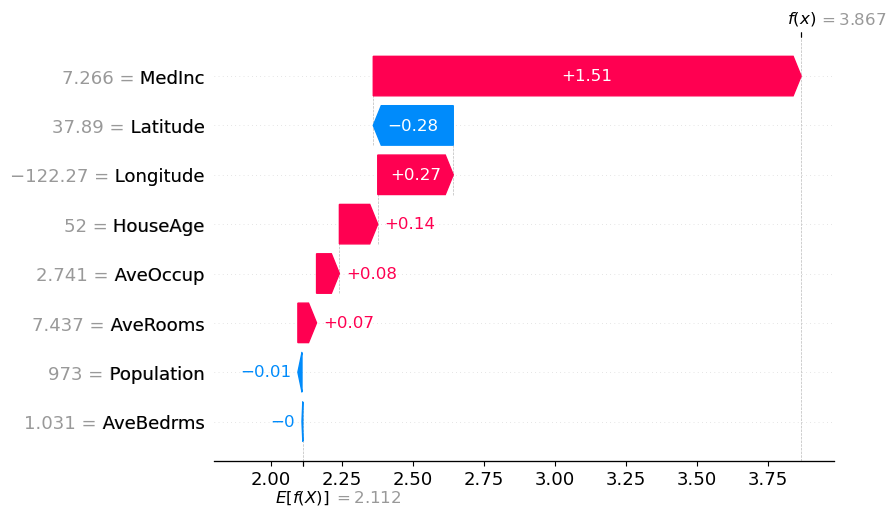

In [147]:
# the waterfall_plot shows how we get from shap_values.base_values to model.predict(X)[sample_ind]
sample_ind = 0
print(sample.iloc[sample_ind])
shap.plots.waterfall(shap_values[sample_ind])

In [148]:
shap_values[sample_ind]

.values =
array([ 1.50645341,  0.13508071,  0.06572812, -0.0029444 , -0.01442768,
        0.08035768, -0.28169975,  0.26594293])

.base_values =
2.1124389999999997

.data =
array([   7.266     ,   52.        ,    7.43661972,    1.03098592,
        973.        ,    2.74084507,   37.89      , -122.27      ])

What happens if we reduce `MedInc` by 1.51 for the sample chosen? Will we get 3.867 - 1.51 = 2.357? Or will interaction effects result in a different answer? I think it's the latter. 

In [128]:
sample_adj = sample.iloc[sample_ind].copy()
sample_adj['MedInc'] = sample_adj['MedInc'] - 1.51
sample_adj

MedInc           5.76
HouseAge        52.00
AveRooms         7.44
AveBedrms        1.03
Population     973.00
AveOccup         2.74
Latitude        37.89
Longitude     -122.27
MedHouseVal      3.71
Name: 415, dtype: float64

In [132]:
sample_adj = sample_adj.drop('MedHouseVal')

In [141]:
sample_adj = pd.DataFrame(sample_adj).T

In [142]:
shap_values = explainer(sample_adj)

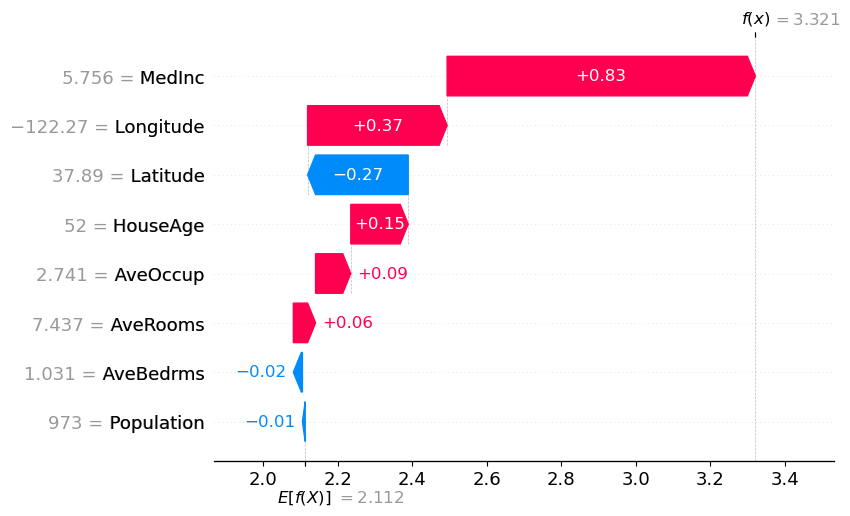

In [144]:
shap.plots.waterfall(shap_values[0])

Yeah so we did not get 2.357 as our predicted output f(x) for probably many reasons including that these waterfall SHAP values don't tell you how a change in the input affects the output but also that calculation was based on the assumption that our model was linear (it is not) and that the regression coefficient for `MedInc` was +1 (it is not - the model is non-parametric). Also interaction effects could play a role. But in any case, SHAP values don't tell you how you should adjust your inputs to achieve a specific output, they just tell you how much each feature pushes the prediction up or down relative to the baseline.